# EUROSTAT Hackathon: Introduction to accessing Satellite Imagery via Sentinel Hub APIs in the Copernicus Data Space Ecosystem

The Sentinel Hub API is a RESTful API interface that provides access to various satellite imagery archives. It allows you to access raw satellite data, rendered images, statistical analysis, and other features.

- BYOC Population data
- Raw Sentinel 5P data
- Raw BYOC Population data
- Statistical API, an example with Land Cover products

## Imports

In [33]:
# Utilities
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from typing import Any, Optional, Tuple

import geopandas as gpd
import contextily as cx

import getpass

from sentinelhub import (
    SHConfig,
    DataCollection,
    SentinelHubCatalog,
    SentinelHubRequest,
    SentinelHubStatistical,
    SentinelHubStatisticalDownloadClient,
    BBox,
    bbox_to_dimensions,
    CRS,
    MimeType,
    Geometry,
    parse_time,
)

In [18]:
# define functions to extract statistics for all acquisition dates
def extract_stats(date, stat_data):
    d = {}
    for key, value in stat_data['outputs'].items():
        stats = value['bands']['B0']['stats']
        if stats['sampleCount']==stats['noDataCount']:
            continue
        else:
            d['date'] = [date]
            for stat_name, stat_value in stats.items():
                if (stat_name=='sampleCount' or stat_name=='noDataCount'):
                    continue
                else:
                    d[f'{key}_{stat_name}'] = [stat_value]
    return pd.DataFrame(d)

def read_acquisitions_stats(stat_data):
    df_li = []
    for aq in stat_data:
        date = aq['interval']['from'][:10]
        df_li.append(extract_stats(date, aq))
    return pd.concat(df_li)

def stats_to_df(stats_data):
    """Transform Statistical API response into a pandas.DataFrame"""
    df_data = []

    for single_data in stats_data["data"]:
        df_entry = {}
        is_valid_entry = True

        df_entry["interval_from"] = parse_time(single_data["interval"]["from"]).date()
        df_entry["interval_to"] = parse_time(single_data["interval"]["to"]).date()

        for output_name, output_data in single_data["outputs"].items():
            for band_name, band_values in output_data["bands"].items():
                band_stats = band_values["stats"]
                if band_stats["sampleCount"] == band_stats["noDataCount"]:
                    is_valid_entry = False
                    break

                for stat_name, value in band_stats.items():
                    col_name = f"{output_name}_{band_name}_{stat_name}"
                    if stat_name == "percentiles":
                        for perc, perc_val in value.items():
                            perc_col_name = f"{col_name}_{perc}"
                            df_entry[perc_col_name] = perc_val
                    else:
                        df_entry[col_name] = value

        if is_valid_entry:
            df_data.append(df_entry)

    return pd.DataFrame(df_data)

def plot_image(
    image: np.ndarray,
    factor: float = 1.0,
    clip_range: Optional[Tuple[float, float]] = None,
    **kwargs: Any
) -> None:
    """Utility function for plotting RGB images."""
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 15))
    if clip_range is not None:
        ax.imshow(np.clip(image * factor, *clip_range), **kwargs)
    else:
        ax.imshow(image * factor, **kwargs)
    ax.set_xticks([])
    ax.set_yticks([])

## Credentials

Credentials for Sentinel Hub services (`client_id` & `client_secret`) can be obtained in your [Dashboard](https://shapps.dataspace.copernicus.eu/dashboard/#/). In the User Settings you can create a new OAuth Client to generate these credentials. For more detailed instructions, visit the relevant [documentation page](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Overview/Authentication.html).

Now that you have your `client_id` & `client_secret`, it is recommended to configure a new profile in your Sentinel Hub Python package. Instructions on how to configure your Sentinel Hub Python package can be found [here](https://sentinelhub-py.readthedocs.io/en/latest/configure.html). Using these instructions you can create a profile specific to using the package for accessing Copernicus Data Space Ecosystem data collections. This is useful as changes to the the config class are usually only temporary in your notebook and by saving the configuration to your profile you won't need to generate new credentials or overwrite/change the default profile each time you rerun or write a new Jupyter Notebook. 

If you are a first time user of the Sentinel Hub Python package for Copernicus Data Space Ecosystem, you should create a profile specific to the Copernicus Data Space Ecosystem. You can do this in the following cell:

In [19]:
# Only run this cell if you have not created a configuration.

config = SHConfig()
#config.sh_client_id = getpass.getpass("Enter your SentinelHub client id")
#config.sh_client_secret = getpass.getpass("Enter your SentinelHub client secret")
config.sh_token_url = "https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token"
config.sh_base_url = "https://sh.dataspace.copernicus.eu"
#config.save("cdse")

However, if you have already configured a profile in Sentinel Hub Python for the Copernicus Data Space Ecosystem, then you can run the below cell entering the profile name as a string replacing `<profile_name>`.

In [20]:
config = SHConfig("cdse")
config

SHConfig(
  instance_id='**************************api/',
  sh_client_id='***********************************d22d',
  sh_client_secret='****************************ebPe',
  sh_base_url='https://sh.dataspace.copernicus.eu',
  sh_auth_base_url=None,
  sh_token_url='https://identity.dataspace.copernicus.eu/auth/realms/CDSE/protocol/openid-connect/token',
  geopedia_wms_url='https://service.geopedia.world',
  geopedia_rest_url='https://www.geopedia.world/rest',
  aws_access_key_id='',
  aws_secret_access_key='',
  aws_session_token='',
  aws_metadata_url='https://roda.sentinel-hub.com',
  aws_s3_l1c_bucket='sentinel-s2-l1c',
  aws_s3_l2a_bucket='sentinel-s2-l2a',
  opensearch_url='http://opensearch.sentinel-hub.com/resto/api/collections/Sentinel2',
  max_wfs_records_per_query=100,
  max_opensearch_records_per_query=500,
  max_download_attempts=4,
  download_sleep_time=5.0,
  download_timeout_seconds=120.0,
  number_of_download_processes=1,
  max_retries=None,
)

## Creating an area of interest

For this example we have created an area of interest centred on Brussels, Belgium. The area of interest is stored in the string as a geojson.

In [21]:
land_cover_samples="""{
  "type": "Polygon",
  "coordinates": [
    [
      [
        4.232541,
        50.776412
      ],
      [
        4.499548,
        50.776412
      ],
      [
        4.499548,
        50.919478
      ],
      [
        4.232541,
        50.919478
      ],
      [
        4.232541,
        50.776412
      ]
    ]
  ]
}
"""

/var/folders/7p/dpt81n653g7cm1ny5rm0_6q80000gn/T/ipykernel_83177/3714186783.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  lcs_gdf["area"] = lcs_gdf.geometry.area


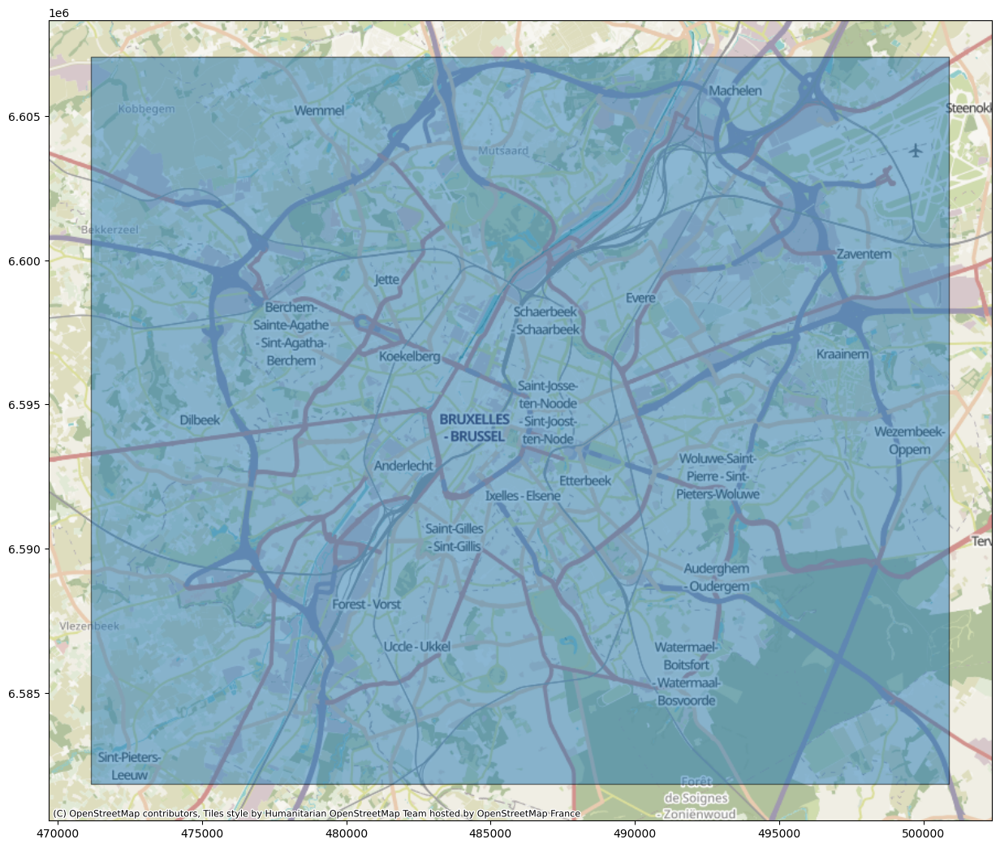

In [22]:
# Read the land cover samples into a GeoDataFrame
lcs_gdf = gpd.read_file(land_cover_samples)

# Calculate the area for each geometry and add it as a new column
lcs_gdf["area"] = lcs_gdf.geometry.area

lcs_gdf_wm = lcs_gdf.to_crs(epsg=3857)

# Explore the GeoDataFrame, visualizing the 'area' column with a specified colormap
ax = lcs_gdf_wm.plot(alpha=0.5, edgecolor="k", figsize = (15,15))
cx.add_basemap(ax)

## Visualising and downloading data with Sentinel Hub APIs

### Example 1: True Color Image with Sentinel-2 L2A imagery

We build the request according to the [API Reference](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/ApiReference.html), using the `SentinelHubRequest` class. Each Process API request also needs an [evalscript](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Evalscript.html). An evalscript (or "custom script") is a piece of Javascript code which defines how the satellite data shall be processed by Sentinel Hub and what values the service shall return. It is a required part of any [process](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Process.html), [batch processing](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Batch.html) or [OGC request](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/OGC.html).

The information that we specify in the `SentinelHubRequest` object is:
- an evalscript,
- a list of input data collections with time interval,
- a format of the response,
- a bounding box and its size (size or resolution).
- `mosaickingOrder` (optional): in this example we have used `leastCC` which will return pixels from the least cloudy acquisition in the specified time period.

The evalscript in the example is used to select the appropriate bands. We return the RGB (B04, B03, B02) Sentinel-2 L2A bands.

The least cloudy image from the time period is downloaded. Without any additional parameters in the evalscript, the downloaded data will correspond to reflectance values in `UINT8` format (values in 0-255 range).

In [23]:
evalscript_true_color = """
    //VERSION=3

    function setup() {
        return {
            input: [{
                bands: ["B02", "B03", "B04"]
            }],
            output: {
                bands: 3
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B04, sample.B03, sample.B02];
    }
"""
lcs_gdf = gpd.read_file(land_cover_samples)
geometry = Geometry(geometry={"type":"Polygon","coordinates":[[[4.232112,50.934173],[4.569817,50.937635],[4.56158,50.75902],[4.240348,50.762495],[4.232112,50.934173]]]}, crs=CRS.WGS84)

In [24]:
request_true_color = SentinelHubRequest(
    evalscript=evalscript_true_color,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A.define_from(
                name="s2l2a", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=("2022-05-01", "2022-05-20"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    geometry=geometry,
    resolution=(0.0002,0.0002),
    config=config,
)

The method `get_data()` will always return a list of length 1 with the available image from the requested time interval in the form of numpy arrays.

In [25]:
true_color_imgs = request_true_color.get_data()

In [26]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (893, 1689, 3)


Image type: uint8


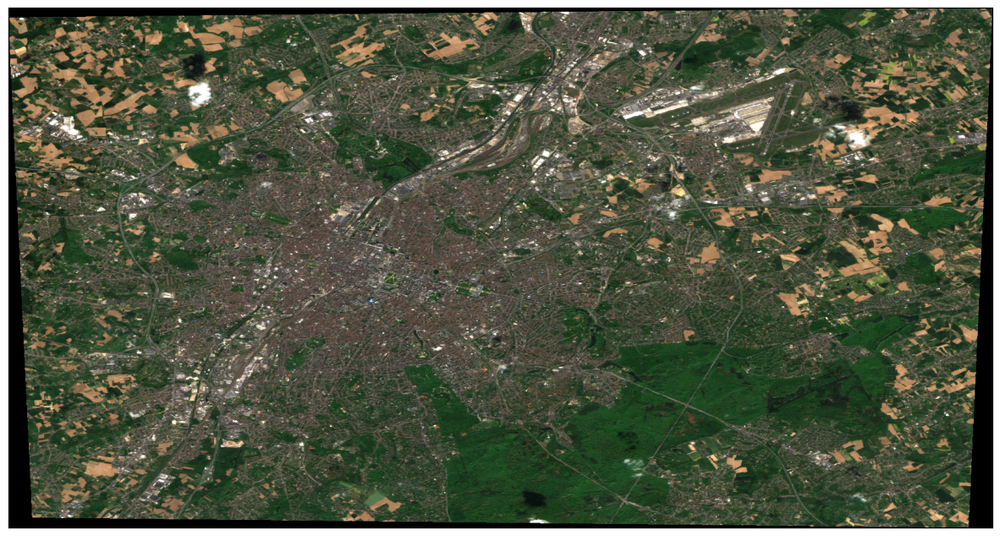

In [27]:
image = true_color_imgs[0]
print(f"Image type: {image.dtype}")

# plot function
# factor 1/255 to scale between 0-1
# factor 3.5 to increase brightness
plot_image(image, factor=3.5 / 255, clip_range=(0, 1))

Jupyter Notebook 1: 
1. Visualising and downloading data with Sentinel Hub APIs

- Sentinel-2 NDVI
- BYOC Population data
2. Accessing raw satellite data
- Raw Sentinel 5P data
- Raw BYOC Population data
3. Deriving spatial-temporal statistics from Earth Observation derived products
- Statistical API, an example with Land Cover products


### Example 2: NDVI Image

Secondly, we will also show you an example of how to calculate and visualise NDVI using the same API. NDVI is a very commonly used spectral vegetation index for vegetation monitoring, for example, monitoring crop growth and yields. As you will notice in the codeblock below, the evalscript has changed substantially:
- we are only using Band 4 and Band 8 as an input into our script.
- In the `evaluatePixel()` function, we calculate NDVI and visualise this using the `imgVals` array. 

In [37]:
evalscript_ndvi = """
//VERSION=3
function setup() {
  return {
    input: [{
      bands: [
        "B04",
        "B08",
        "dataMask"
      ]
    }],
    output: {
      bands: 4
    }
  }
}
  

function evaluatePixel(sample) {
    let val = (sample.B08 - sample.B04) / (sample.B08 + sample.B04);
    let imgVals = null;
    
    if (val<-1.1) imgVals = [0,0,0];
    else if (val<-0.2) imgVals = [0.75,0.75,0.75];
    else if (val<-0.1) imgVals = [0.86,0.86,0.86];
    else if (val<0) imgVals = [1,1,0.88];
    else if (val<0.025) imgVals = [1,0.98,0.8];
    else if (val<0.05) imgVals = [0.93,0.91,0.71];
    else if (val<0.075) imgVals = [0.87,0.85,0.61];
    else if (val<0.1) imgVals = [0.8,0.78,0.51];
    else if (val<0.125) imgVals = [0.74,0.72,0.42];
    else if (val<0.15) imgVals = [0.69,0.76,0.38];
    else if (val<0.175) imgVals = [0.64,0.8,0.35];
    else if (val<0.2) imgVals = [0.57,0.75,0.32];
    else if (val<0.25) imgVals = [0.5,0.7,0.28];
    else if (val<0.3) imgVals = [0.44,0.64,0.25];
    else if (val<0.35) imgVals = [0.38,0.59,0.21];
    else if (val<0.4) imgVals = [0.31,0.54,0.18];
    else if (val<0.45) imgVals = [0.25,0.49,0.14];
    else if (val<0.5) imgVals = [0.19,0.43,0.11];
    else if (val<0.55) imgVals = [0.13,0.38,0.07];
    else if (val<0.6) imgVals = [0.06,0.33,0.04];
    else imgVals = [0,0.27,0];
    
    
    imgVals.push(sample.dataMask)
    
    return imgVals
}
"""

request_ndvi_img = SentinelHubRequest(
    evalscript=evalscript_ndvi,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L2A.define_from(
                name="s2l2a", service_url="https://sh.dataspace.copernicus.eu"
            ),
            time_interval=("2022-05-01", "2022-05-20"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.PNG)],
    geometry=geometry,
    resolution=(0.0002,0.0002),
    config=config,
)

The same method as before is used to request and then visualise the data. In the visualisation, the lighter greens indicate a higher NDVI value (vegetation, forest) and the darker greens (urban areas and water bodies) represent areas with lower NDVI values.

In [38]:
ndvi_img = request_ndvi_img.get_data()

In [39]:
print(
    f"Returned data is of type = {type(true_color_imgs)} and length {len(true_color_imgs)}."
)
print(
    f"Single element in the list is of type {type(true_color_imgs[-1])} and has shape {true_color_imgs[-1].shape}"
)

Returned data is of type = <class 'list'> and length 1.
Single element in the list is of type <class 'numpy.ndarray'> and has shape (893, 1689, 3)


Image type: uint8


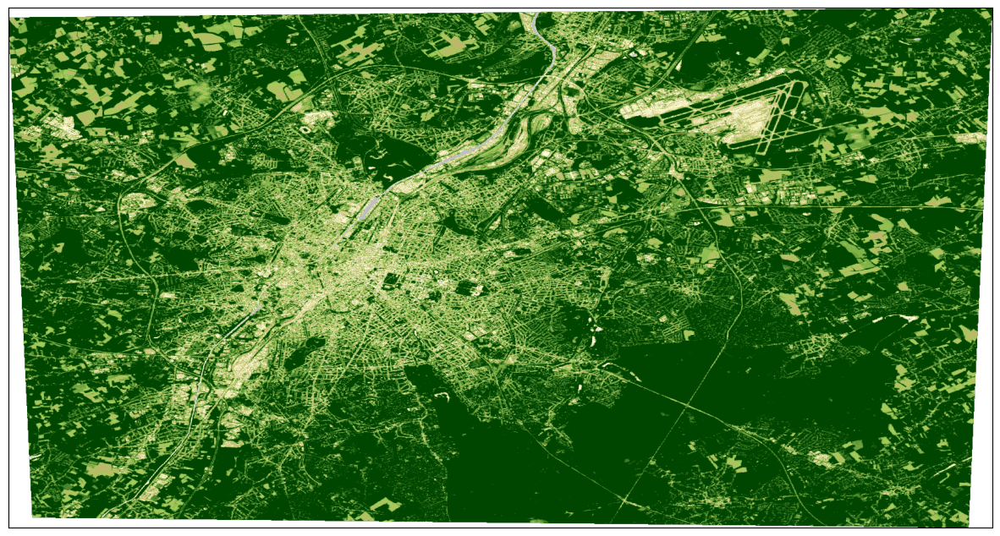

In [40]:
image = ndvi_img[0]
print(f"Image type: {image.dtype}")

# plot function
plot_image(image, factor=1 / 255)

### Example 3: All Sentinel-2's raw band values 

Now let's define an evalscript which will return all Sentinel-2 spectral bands with raw values.

In this example we are downloading already quite a big chunk of data, so optimization of the request is not out of the question. Downloading raw digital numbers in the `INT16` format instead of reflectances in the `FLOAT32` format means that much less data is downloaded, which results in a faster download and a smaller usage of SH processing units.

In order to achieve this, we have to set the input units in the evalscript to `DN` (digital numbers) and the output `sampleType` argument to `INT16`. Additionally, we can't pack all Sentinel-2's 13 bands into a `PNG` image, so we have to set the output image type to the `TIFF` format via `MimeType.TIFF` in the request.

The digital numbers are in the range from 0-10000, so we have to scale the downloaded data appropriately.

In [41]:
evalscript_all_bands = """
    //VERSION=3
    function setup() {
        return {
            input: [{
                bands: ["B01","B02","B03","B04","B05","B06","B07","B08","B8A","B09","B10","B11","B12"],
                units: "DN"
            }],
            output: {
                bands: 13,
                sampleType: "INT16"
            }
        };
    }

    function evaluatePixel(sample) {
        return [sample.B01,
                sample.B02,
                sample.B03,
                sample.B04,
                sample.B05,
                sample.B06,
                sample.B07,
                sample.B08,
                sample.B8A,
                sample.B09,
                sample.B10,
                sample.B11,
                sample.B12];
    }
"""

request_all_bands = SentinelHubRequest(
    evalscript=evalscript_all_bands,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C.define_from("s2l1c", service_url=config.sh_base_url),
            time_interval=("2022-05-01", "2022-05-20"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    geometry=geometry,
    resolution=(0.0002,0.0002),
    config=config,
)

In [42]:
all_bands_response = request_all_bands.get_data()

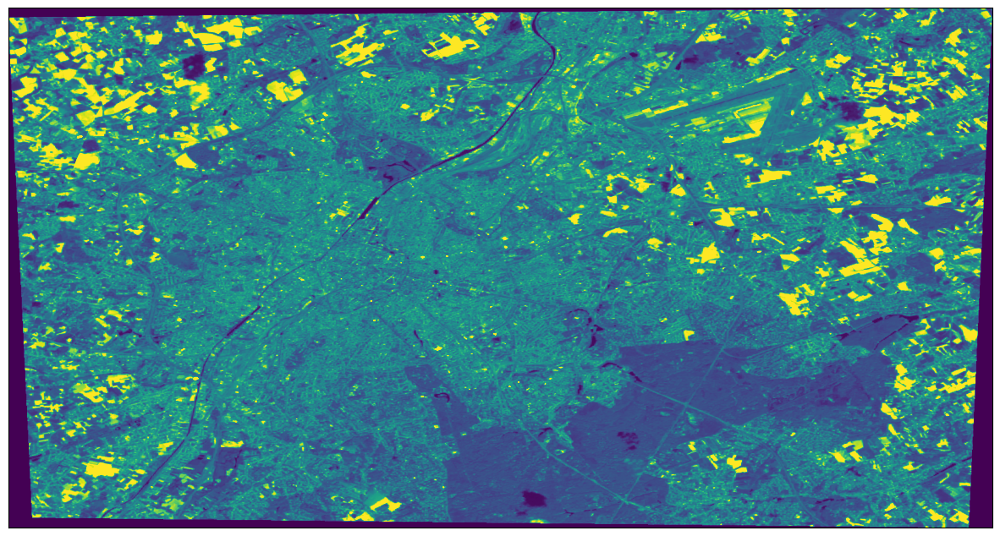

In [43]:
# Image showing the SWIR band B12
# Factor 1/1e4 due to the DN band values in the range 0-10000
# Factor 3.5 to increase the brightness
plot_image(all_bands_response[0][:, :, 12], factor=3.5 / 1e4, vmax=1)

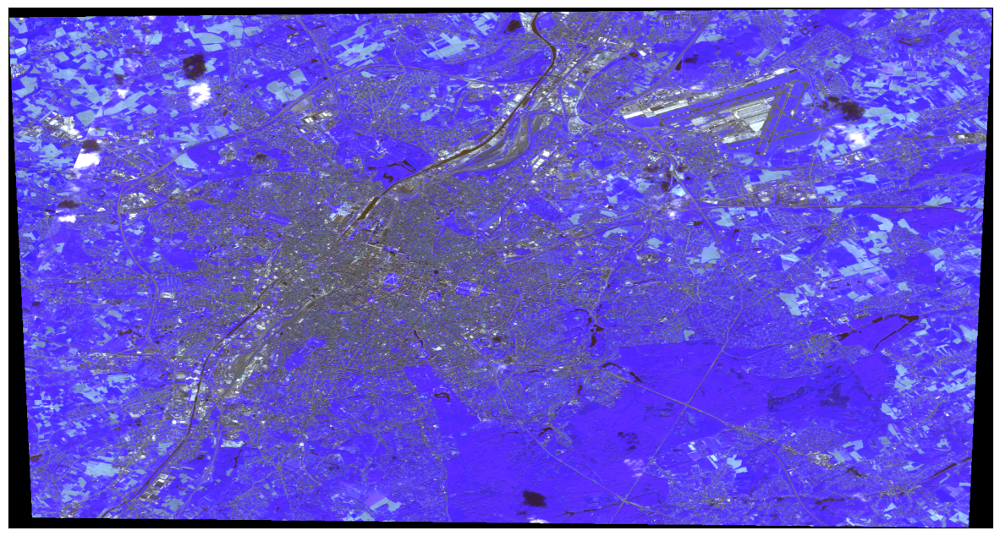

In [44]:
# From raw bands we can also construct a False-Color image
# False color image is (B03, B04, B08)
plot_image(all_bands_response[0][:, :, [2, 3, 7]], factor=3.5 / 1e4, clip_range=(0, 1))

### Example 4: Save downloaded data to disk and read it from disk

All downloaded data can be saved to disk and later read from it. Simply specify the location on disk where data should be saved (or loaded from) via the `data_folder` argument of the request's constructor. When executing the request's `get_data` method, set the argument `save_data` to `True`.

This also means that in all the future requests for data, the request will first check the provided location if the data is already there, unless you explicitly demand to redownload the data.

In [45]:
request_all_bands = SentinelHubRequest(
    data_folder="test_dir",
    evalscript=evalscript_all_bands,
    input_data=[
        SentinelHubRequest.input_data(
            data_collection=DataCollection.SENTINEL2_L1C.define_from("s2l1c", service_url=config.sh_base_url),
            time_interval=("2022-05-01", "2022-05-20"),
            other_args={"dataFilter": {"mosaickingOrder": "leastCC"}},
        )
    ],
    responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
    geometry=geometry,
    resolution=(0.0002,0.0002),
    config=config,
)

In [46]:
%%time
all_bands_img = request_all_bands.get_data(save_data=True)

CPU times: user 281 ms, sys: 135 ms, total: 416 ms
Wall time: 7.57 s


In [48]:
print(
    "The output directory has been created and a tiff file with all 13 bands was saved into the following structure:\n"
)

for folder, _, filenames in os.walk(request_all_bands.data_folder):
    for filename in filenames:
        print(os.path.join(folder, filename))

The output directory has been created and a tiff file with all 13 bands was saved into the following structure:

test_dir/c0bbac0e2e9cc38ec769014ddcd2acd3/request.json
test_dir/c0bbac0e2e9cc38ec769014ddcd2acd3/response.tiff


In [49]:
%%time
# try to re-download the data
all_bands_img_from_disk = request_all_bands.get_data()

CPU times: user 208 ms, sys: 34.8 ms, total: 243 ms
Wall time: 84.7 ms


In [50]:
%%time
# force the redownload
all_bands_img_redownload = request_all_bands.get_data(redownload=True)

CPU times: user 331 ms, sys: 150 ms, total: 481 ms
Wall time: 15.1 s


#### Save downloaded data directly to disk

The `get_data` method returns a list of numpy arrays and can save the downloaded data to disk, as we have seen in the previous example. Sometimes it is convenient to just save the data directly to disk. You can do that by using `save_data` method instead.

In [51]:
%%time
request_all_bands.save_data()

CPU times: user 290 μs, sys: 196 μs, total: 486 μs
Wall time: 334 μs


In [52]:
print(
    "The output directory has been created and a tiff file with all 13 bands was saved into the following structure:\n"
)

for folder, _, filenames in os.walk(request_all_bands.data_folder):
    for filename in filenames:
        print(os.path.join(folder, filename))

The output directory has been created and a tiff file with all 13 bands was saved into the following structure:

test_dir/c0bbac0e2e9cc38ec769014ddcd2acd3/request.json
test_dir/c0bbac0e2e9cc38ec769014ddcd2acd3/response.tiff


### Example 5: Raw Sentinel 5P data

## Accessing the EUROSTAT data using the APIs

### Example 1: Visualising the BYOC Population data
### Example 2: Raw BYOC Population data

## Extracting Statistics from satellite imagery

### Example 1: Creating time series for multiple fields of interest

In [28]:
austria_fields = """
{
"type": "FeatureCollection",
"name": "austria_fields",
"crs": { "type": "name", "properties": { "name": "urn:ogc:def:crs:EPSG::3857" } },
"features": [
{ "type": "Feature", "properties": { "fid": 1285619, "RFL_ID": 108015743.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 3.405187, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203406200171/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203406200171.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203406200171/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203406200171.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2020-02-12T13:42:07", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363031342E3938383134333720323730353639362E363735353131383220343830363031332E363931383538373820323730353639312E393333323537323720343830363031372E393130333130303320323730353637312E353533353930333520343830363032372E383731333734363120323730353633362E313830303834323520343830363037302E323039333530323220323730353437382E353139393232333220343830363139372E393531353434343920323730353438382E383136393633303920343830363230352E373632393032363820323730353439322E303435353939363520343830363231332E363730313533393620323730353530302E323831333931343120343830363137382E3639353039383120323730353636352E343836383634323520343830363137312E383439323334333920323730353639322E313531333136353720343830363136322E303331323937313420323730353731302E333033363937323720343830363135372E333639393139353120323730353731332E383037313332343720343830363135312E353335313535393320323730353731342E3932383232323420343830363131392E373634303135383720323730353731312E383132393530383720343830363131352E393335373333303820323730353731312E303430383839363920343830363130332E313837323832383920323730353730392E363438353039303320343830363033352E313831363937303420323730353639352E393732323232363520343830363032322E323236323936333920323730353639352E383136373630393920343830363031342E3938383134333720323730353639362E3637353531313832203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 854.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827245.85460563423112, 5987194.588551948778331 ], [ 1827243.370380397187546, 5987187.780263729393482 ], [ 1827247.0430196239613, 5987157.27132124453783 ], [ 1827257.285728002665564, 5987103.979268457740545 ], [ 1827299.918946804711595, 5986866.722664936445653 ], [ 1827488.418557854136452, 5986865.542153110727668 ], [ 1827500.265457244822755, 5986869.291698739863932 ], [ 1827512.869939968688414, 5986880.392147633247077 ], [ 1827481.964454774977639, 5987127.805090847425163 ], [ 1827475.216012011049315, 5987167.892069781199098 ], [ 1827463.062276459531859, 5987195.84132192377001 ], [ 1827456.661578974220902, 5987201.589120746590197 ], [ 1827448.247417634585872, 5987203.983426792547107 ], [ 1827401.294971028110012, 5987203.462158123031259 ], [ 1827395.588530506007373, 5987202.815970424562693 ], [ 1827376.73091236455366, 5987202.397379309870303 ], [ 1827275.366690668510273, 5987190.974384196102619 ], [ 1827256.358148422557861, 5987192.400952845811844 ], [ 1827245.85460563423112, 5987194.588551948778331 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1286827, "RFL_ID": 108010016.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 18.368332, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203401500014/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203401500014.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203401500014/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203401500014.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2017-01-23T22:16:00", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830353734322E363735333031373420323730353337392E313831383231353620343830353832322E393836373230383920323730343735322E393039313031363620343830353832362E373534393539343520323730343735302E3038313535333420343830363032382E393732303736343120323730343832382E313632383535343420343830363033332E303136373032313820323730343833332E353937323436353320343830363034302E323131373431363120323730343933302E313833343739383220343830363034322E393330313231303320323730343937312E393039353732363220343830363034382E393136393735393820323730353031392E343738313133313820343830363038322E323934343430353620323730353132342E363936313133363420343830363039362E333732343838313920323730353137342E383933363735313420343830363130332E383039343933323520323730353232352E37383438363820343830363130322E333637373532393420323730353237372E3335393434333520343830363039352E393231323033323820323730353332312E363339393937383620343830363039342E333032393738363520323730353332372E393533323639383620343830363037322E313033323532323820323730353431312E3935323638393520343830363036302E353238303338343820323730353435342E3430383635383220343830363035352E363139353336323920323730353435372E333138363837373420343830353930342E393831323631303920323730353432312E363636343938393420343830353836392E313033383835393720323730353431332E363438373331343120343830353734362E303833313133323720323730353338342E303730353438343220343830353734322E363735333031373420323730353337392E3138313832313536203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 920.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1826807.622585895936936, 5986762.474575977772474 ], [ 1826848.234849396627396, 5985831.320449212566018 ], [ 1826853.40924621745944, 5985826.681841840036213 ], [ 1827159.377465040888637, 5985915.669120309874415 ], [ 1827165.974231104366481, 5985923.143154987134039 ], [ 1827188.413550951750949, 5986064.243723629973829 ], [ 1827197.536311129340902, 5986125.25087030697614 ], [ 1827212.168995603919029, 5986194.431797341443598 ], [ 1827274.04630285478197, 5986344.884408954530954 ], [ 1827300.862509782193229, 5986416.89908083435148 ], [ 1827318.031330853933468, 5986490.782653839327395 ], [ 1827322.271591496188194, 5986566.806057645939291 ], [ 1827318.278081396361813, 5986632.743707299232483 ], [ 1827316.684048287570477, 5986642.234084282070398 ], [ 1827294.494411431485787, 5986768.591951441951096 ], [ 1827282.758869512239471, 5986832.503207293339074 ], [ 1827275.923005741322413, 5986837.409581060521305 ], [ 1827050.742999553913251, 5986804.223971929401159 ], [ 1826997.170666819904, 5986797.015554131940007 ], [ 1826813.219185540219769, 5986769.228487577289343 ], [ 1826807.622585895936936, 5986762.474575977772474 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1287047, "RFL_ID": 108266839.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 12.127094, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100035/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100035.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100035/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100035.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2017-01-23T22:16:00", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363638322E373433343333363720323730353035352E393830303539363720343830363638332E393631373036323820323730353035332E363336323436323120343830373234302E303835383432333420323730353036372E363334393932373220343830373231392E333733313538373220323730353239352E393339313437363620343830373231362E313830323537373820323730353239392E3230373331313420343830373136312E363136313235303720323730353330342E343634383435313320343830363934382E3732383335313820323730353333362E333037303837393320343830363832372E343930353538373220323730353333332E3235313833313520343830363736352E323530393734313220323730353137362E303433383139323120343830363735352E333631303732353420323730353135362E353130373533313720343830363734332E3133383931363920323730353133382E323231363532353220343830363638322E373433343333363720323730353035352E3938303035393637203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 616.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1828145.58664693729952, 5986167.090891021303833 ], [ 1828147.083062309538946, 5986163.48872506711632 ], [ 1828963.841035352088511, 5986112.903518505394459 ], [ 1828961.672522438922897, 5986451.255743359215558 ], [ 1828957.396506718359888, 5986456.470218824222684 ], [ 1828878.07606403157115, 5986471.18765895627439 ], [ 1828569.994501803768799, 5986545.261653937399387 ], [ 1828391.928185331635177, 5986556.283416159451008 ], [ 1828281.315968015231192, 5986333.080591690726578 ], [ 1828264.412093504332006, 5986305.623848236165941 ], [ 1828244.243652038509026, 5986280.294645157642663 ], [ 1828145.58664693729952, 5986167.090891021303833 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1288672, "RFL_ID": 108069009.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 10.395215, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100072/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100072.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100072/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100072.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2017-01-23T22:16:00", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363230322E343430333339313720323730343437302E333732363531363420343830363230322E353233373834363920323730343436362E3038363930353920343830363231362E303236383432323720323730343435322E383637333937363420343830363234352E343330383338343320323730343431382E353834373638393720343830363330322E323336383032303720323730343337362E353331343533323220343830363335382E323635383738313720323730343333342E32363933343720343830363438322E343531313033383720323730343233382E343934363031393420343830363536352E333630333539313320323730343137372E313230333636323120343830363538392E373635303236383320323730343230312E303838373536383720343830363630332E3531383933323420323730343231332E323536363635373220343830363631332E353231333732363420323730343232312E313732353239323120343830363632372E303031303639333220323730343233302E393539333937333120343830363633382E383430383438373920323730343233382E363039333138343820343830363634392E343031373533343220323730343234342E373434303933363520343830363636342E353734303235383520323730343235322E333938373435333220343830363638312E373335353532363820323730343235372E313233303732353520343830363638302E303334343433363220323730343235382E343036373731343520343830363639372E3138363930373120323730343236332E333335393436343220343830363639302E3837363234383720323730343332332E353231383334373620343830363638372E393238393733383120323730343335392E383536333331363120343830363334322E3730393534353920323730343632302E343032343635303920343830363230322E343430333339313720323730343437302E3337323635313634203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 953.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827369.528221862623468, 5985367.441029831767082 ], [ 1827369.12263303110376, 5985361.129104856401682 ], [ 1827387.282233088510111, 5985339.967694828286767 ], [ 1827426.148930787341669, 5985285.806324467994273 ], [ 1827504.21309506543912, 5985216.719138179905713 ], [ 1827581.111862561432645, 5985147.424061576835811 ], [ 1827751.290076610166579, 5984990.742738700471818 ], [ 1827865.218491764273494, 5984889.912528466433287 ], [ 1827903.934001046000049, 5984922.031153936870396 ], [ 1827925.588119876571, 5984938.162183507345617 ], [ 1827941.220971334259957, 5984948.521400341764092 ], [ 1827962.179922969313338, 5984961.186808911152184 ], [ 1827980.472450816305354, 5984970.920086443424225 ], [ 1827996.70423334161751, 5984978.589259013533592 ], [ 1828019.880743251880631, 5984987.903348707593977 ], [ 1828045.611048866529018, 5984992.654834096319973 ], [ 1828043.276552282972261, 5984994.759650454856455 ], [ 1828069.018865678226575, 5984999.813394010998309 ], [ 1828067.191260131075978, 5985089.106781903654337 ], [ 1828067.351827000500634, 5985142.903755269013345 ], [ 1827593.568654931150377, 5985570.107640437781811 ], [ 1827369.528221862623468, 5985367.441029831767082 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1289075, "RFL_ID": 108041908.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 7.186696, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100052/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100052.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100052/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100052.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2017-01-23T22:16:00", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363332372E3035373132303320323730343731362E383135303437393420343830363332322E353831373832303820323730343639382E393130383738323220343830363333352E373336373837333220323730343633392E313230333432393420343830363336372E353632343137323520323730343637302E303639393737363820343830363339352E383731323737393720323730343639312E373536393739313120343830363432322E3237323330363920323730343730372E323930313231313520343830363439332E323539333130343120323730343734302E343039333534383420343830363531332E383333393431313420323730343735352E323839363538373220343830363532382E343739383436363120323730343736392E383833373730343620343830363534302E353930313737333720323730343738372E363931393030373620343830363535302E373432313535343920323730343830372E373038383633333220343830363635332E383535323239393920323730353034332E353634393632373820343830363431312E333636323333313120323730353033382E333336393332343420343830363430362E333936353738313820323730353033342E333637393535383820343830363332372E3035373132303320323730343731362E3831353034373934203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 719.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827582.509621815523133, 5985713.865830066613853 ], [ 1827573.745020183501765, 5985688.112592314369977 ], [ 1827585.65654269955121, 5985598.519903073087335 ], [ 1827636.109825797611848, 5985639.958663059398532 ], [ 1827680.268393783597276, 5985668.227646538056433 ], [ 1827720.872967279981822, 5985687.692113175988197 ], [ 1827828.985650439513847, 5985727.314437142573297 ], [ 1827860.971821221755818, 5985746.563256904482841 ], [ 1827884.234315495472401, 5985766.149163485504687 ], [ 1827904.177222537109628, 5985790.784935466013849 ], [ 1827921.522560516837984, 5985818.91886340547353 ], [ 1828101.718132541747764, 5986152.530401583760977 ], [ 1827745.689628589898348, 5986175.847844732925296 ], [ 1827737.917061764979735, 5986170.647081059403718 ], [ 1827582.509621815523133, 5985713.865830066613853 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1290549, "RFL_ID": 107943454.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 20.060314, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203401500039/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203401500039.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203401500039/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203401500039.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2019-02-24T16:29:20", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830353336302E313931303530303120323730353237332E313030313239373720343830353335392E343036313233313720323730353236382E363832333734393420343830353336342E383236343236303920323730353235302E303632353934373620343830353336362E3136323633303620323730353234332E343233363336363720343830353337302E353337303337353920323730353233302E343439313530383920343830353338362E393830303239363920323730353138312E363737373630383120343830353339322E3434353030323120323730353135352E3438343036333520343830353339352E313035313232373520323730353133302E313032353538333220343830353339362E383531363035343620323730353130342E333636363237303620343830353339382E313334393737383620323730353037382E383637323335363520343830353339392E39393839393120323730353035352E393239353337313320343830353430342E383730353439373220323730353033322E393137313536333320343830353431312E313037393833373720323730353031312E313035353838383820343830353432302E313230383636343220323730343938382E3733383738393920343830353433302E393034383632383220323730343936372E383937323837343620343830353435352E3739323430303820323730343933322E373539303237343120343830353438342E353937373031393320323730343930342E3538373139393320343830353439372E383631313933393420323730343839342E343937353038363220343830353535332E333937393133333720323730343834322E333339383933313520343830353539372E3530373938323120323730343830332E323939333531383820343830353634372E3438303939363120323730343736322E313833373630373220343830353636352E353332353633393920323730343734302E313132333739353320343830353637372E363432313432313420323730343732312E333133393238343620343830353638372E313632383231323920323730343730302E363837333237383120343830353639322E353233303933353520323730343639382E343938343830353720343830353831332E353533313839383620323730343734352E323835343237373420343830353831372E3430333136383720323730343735302E373733373233383120343830353734332E323732323830323520323730353333352E303231333737303120343830353733382E3138373132303320323730353337352E313034333636393920343830353733372E383131393239323120323730353337382E303631363432393520343830353733332E343135313031353820323730353338312E303835383935323520343830353634372E383634333431323420323730353336322E3638343633303120343830353531392E303136333637363720323730353332382E353038363232363620343830353435342E373033373032393420323730353331302E343635363532333120343830353432372E353538303939383120323730353239332E373435303939343320343830353431302E303730323839383420323730353238362E343134313032353320343830353336302E313931303530303120323730353237332E3130303132393737203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 1457.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1826233.970253467094153, 5986655.291615686379373 ], [ 1826232.276412565493956, 5986648.895366312935948 ], [ 1826237.930495951790363, 5986620.823280168697238 ], [ 1826239.072313408832997, 5986610.890169130638242 ], [ 1826243.887816709466279, 5986591.253056391142309 ], [ 1826261.988486674148589, 5986517.437126790173352 ], [ 1826266.776247113011777, 5986478.22238402068615 ], [ 1826267.552987086120993, 5986440.559938319027424 ], [ 1826266.947078813798726, 5986402.493028583005071 ], [ 1826265.691534148762003, 5986364.833183279260993 ], [ 1826265.602095408830792, 5986330.866299103014171 ], [ 1826269.911367549793795, 5986296.406063445843756 ], [ 1826276.370146022411063, 5986263.537455041892827 ], [ 1826286.828280112473294, 5986229.498464353382587 ], [ 1826300.069686386734247, 5986197.47650614194572 ], [ 1826332.222341054352, 5986142.63297160435468 ], [ 1826370.973338678712025, 5986097.533414199948311 ], [ 1826389.170773883815855, 5986081.005117187276483 ], [ 1826464.146861719200388, 5985997.22594740614295 ], [ 1826523.98917208542116, 5985934.19226043112576 ], [ 1826592.167643572902307, 5985867.359269617125392 ], [ 1826615.906903908587992, 5985832.602269681170583 ], [ 1826631.34061101381667, 5985803.416096600703895 ], [ 1826642.755183259490877, 5985771.872354759834707 ], [ 1826650.341399974888191, 5985767.969844338484108 ], [ 1826833.471403333824128, 5985821.315127694047987 ], [ 1826839.78917924920097, 5985828.89346057549119 ], [ 1826803.061277317814529, 5986697.45959347859025 ], [ 1826800.542386401677504, 5986757.051591250114143 ], [ 1826800.356524505419657, 5986761.448236426338553 ], [ 1826794.284459178103134, 5986766.456814681179821 ], [ 1826666.629095647484064, 5986750.318492650054395 ], [ 1826473.573255743598565, 5986716.506531550548971 ], [ 1826377.091610695933923, 5986698.180381611920893 ], [ 1826335.247910300735384, 5986677.055968789383769 ], [ 1826308.714635806158185, 5986668.50675431266427 ], [ 1826233.970253467094153, 5986655.291615686379373 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1293441, "RFL_ID": 107991674.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 15.556506, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100053/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100053.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100053/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100053.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2020-10-07T22:25:05", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363037382E333235333738353220323730353034362E313636343131363120343830363038302E313539393833393520323730353034322E303639323536383620343830363039332E393931323231323820323730353034312E393632353338333620343830363238342E383235323933343720323730353034362E343236373133313920343830363430312E303734323031353420323730353034382E373832373635323320343830363430342E383036323139393620323730353035302E3834383031333920343830363434392E323338353632303320323730353232382E363633343436313520343830363435372E323132303536383620323730353236302E353932373937333120343830363435382E303433323936313520323730353236332E393138333032343820343830363436362E323130323634303920323730353239362E353839373434313220343830363438382E343131343437373620323730353338352E343234373636323920343830363531372E353738393833303220323730353530322E313733353334363420343830363531342E353639333531393220323730353530352E363637363330303620343830363431372E383536303431393220323730353439362E313339353334363620343830363234382E333636393130393120323730353438312E313833373732383220343830363038312E353837303431333320323730353436362E333531383337363820343830363037392E353037393136323820323730353436332E323332393235353920343830363038352E323833343038363420323730353433312E323638313238323520343830363039352E323338363138323120323730353339362E3730343434353820343830363130332E383331393230313820323730353337362E303134313139393620343830363131312E3533353632303520323730353334372E323734323835313720343830363131392E303034303436343720323730353330372E373337303730373720343830363132302E393032343831323420323730353238382E313432333635343520343830363132342E363931373438333820323730353238382E323334363834353220343830363132332E303338313830383520323730353236362E303539353230323420343830363132322E323431313538303220323730353232302E363534383432323420343830363131362E343535343238313320323730353137332E3536373334313620343830363130392E313039373933343520323730353134332E333334383333353920343830363039342E373238333431383420323730353039342E313332333237303320343830363037382E333235333738353220323730353034362E3136363431313631203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 1228.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827258.55655868910253, 5986229.918385926634073 ], [ 1827260.740684627089649, 5986223.659456582739949 ], [ 1827280.998399592237547, 5986221.735664567910135 ], [ 1827561.231334927491844, 5986203.916718065738678 ], [ 1827731.893369086319581, 5986192.52313666138798 ], [ 1827737.617465372895822, 5986195.082853903062642 ], [ 1827824.655223964946344, 5986450.868691341020167 ], [ 1827840.277414727956057, 5986496.800070192664862 ], [ 1827841.905656249029562, 5986501.583825764246285 ], [ 1827857.903091554297134, 5986548.581914982758462 ], [ 1827901.394202403957024, 5986676.373429831117392 ], [ 1827958.538986996747553, 5986844.323241324163973 ], [ 1827954.558655936736614, 5986849.846236028708518 ], [ 1827811.632689679507166, 5986848.201228518038988 ], [ 1827561.371247225441039, 5986847.874203384853899 ], [ 1827315.096136158332229, 5986847.375481954775751 ], [ 1827311.664552205940709, 5986843.05466743092984 ], [ 1827316.191785388626158, 5986795.311757366172969 ], [ 1827326.524919845629483, 5986743.213394374586642 ], [ 1827336.570955139584839, 5986711.690164485946298 ], [ 1827344.321408900199458, 5986668.443891629576683 ], [ 1827350.396785876015201, 5986609.350436499342322 ], [ 1827350.765273798257113, 5986580.294123471714556 ], [ 1827356.330369018483907, 5986579.945738644339144 ], [ 1827351.174987286096439, 5986547.548832250759006 ], [ 1827344.41336591145955, 5986480.884275387041271 ], [ 1827330.133037932217121, 5986412.383044019341469 ], [ 1827315.642998084891587, 5986368.865991959348321 ], [ 1827288.504734876798466, 5986298.353682707063854 ], [ 1827258.55655868910253, 5986229.918385926634073 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1293538, "RFL_ID": 107750293.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 8.560677, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100084/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100084.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100084/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100084.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2020-10-07T22:25:06", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363030392E313033383434343820323730333937392E393735313830353720343830363031322E303332353137333120323730333937392E383034363636393520343830363031312E3734323438333320323730333934312E373339373731303420343830363031332E383432363735333520323730333934312E363839343539323620343830363031342E383439343838393720323730333836362E323436323038333720343830363031342E333236303431323220323730333836362E323339353836333320343830363031392E373339343036393220323730333738312E323333393430383620343830363135302E333739373736363920323730333739322E3234353432373120343830363135332E383039303739383820323730333831312E303033343433393420343830363135392E363036363535333320323730333835312E373030373931313620343830363136312E303034393230363820323730333836362E313135353734303820343830363136322E303432333936393620323730333836362E313135333538373620343830363135342E353539343934353520323730333836362E313930353931383120343830363136312E303439333833303320323730333837322E313238363034343620343830363136312E353236333431333720323730333930322E303936363034343320343830363136302E373233373533393920323730333933382E333734373733373620343830363136302E343937313937323420323730333933382E333830313237343720343830363136302E353038353932373320323730333933392E363339333236333220343830363136302E393036313231333720323730333937332E383730323239393620343830363136312E373631363033323620323730333937332E383431343139323720343830363136332E373935313339373920323730343031312E333631363033313220343830363136312E343737383337383920323730343031312E343532373536363420343830363136332E343339363731313520323730343034372E313735313939353820343830363136322E353730333134303220323730343034372E323233333833323120343830363136322E363237343436363920323730343036352E373430353333393220343830363136332E373038373638323920323730343036352E363737323937373220343830363136322E3031323930343320323730343038302E323231373639303720343830363135392E303032363432353220323730343039322E363935363937383720343830363135352E343033383830323920323730343130332E363637393639363720343830363135302E363735333333393220323730343131342E323539363132353920343830363134352E393138373231373420323730343132332E353136313731393420343830363134322E393037313637393520323730343134372E373030353136323420343830363133382E333537333733363220323730343136342E333032353038373620343830363133372E3935363537393220323730343136392E3835333939383520343830363133392E323035333630323420323730343139362E393936353932313520343830363134312E393236333230323620323730343231372E383636313234373120343830363135342E313338383337303120323730343237352E333337333733323820343830363136322E3237373837383520323730343331312E323035353234363520343830363136332E333930373433323120323730343331342E363632343236373720343830363137392E343033363631373920323730343334362E383435393737343920343830363138302E363636393333303120323730343334382E373133383532303220343830363139342E333235343836363420323730343336312E363131313933333720343830363139362E3631393238313420323730343336342E313131333634333820343830363233332E383333323539313520323730343430342E3634343935323820343830363233332E353832343732353320323730343431322E353737363532383420343830363232392E3931313633313520323730343431382E393533343635363620343830363230352E333330323739353720323730343434352E393238323133323520343830363230312E313230333035343820323730343435322E353834303434363620343830363139322E323731383933333220323730343436302E303734383539323420343830363131302E383735353034363920323730343337342E323434373334313320343830363130382E39383637383720323730343337342E343732323230313920343830363130342E343137373438363520323730343337352E303036303732353320343830363032302E363436313435353820323730343238362E393036333930343720343830363031372E3430303938383920323730343237322E313134323434343820343830363031342E323336373733323420323730343137332E313132363335343620343830363031332E333435313832363820323730343137332E313432373530343920343830363031322E303539323238343420323730343132392E343736353934393220343830363031312E303739333138353820323730343038342E323536373836313120343830363031312E363337333839303220323730343037342E333739393832343920343830363031332E363539333734383920323730343037342E323633393037323520343830363031332E373037393736343920323730343035352E3438343338393620343830363031382E303430373239303620323730343035352E323433383036393420343830363031362E333239383730333420323730343034302E393233343436303420343830363031352E353038313839353720323730343031372E313634343332353520343830363031302E353939373933303620323730343031372E333535383832393820343830363030392E313033383434343820323730333937392E3937353138303537203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 2443.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827025.832926352974027, 5984671.134869039058685 ], [ 1827030.103389992378652, 5984670.510265190154314 ], [ 1827024.992823153035715, 5984614.585356961935759 ], [ 1827028.064070613589138, 5984614.243250464089215 ], [ 1827020.25290546240285, 5984503.201199302449822 ], [ 1827019.485085003776476, 5984503.258292929269373 ], [ 1827016.954010810703039, 5984377.597073654644191 ], [ 1827209.733279754640535, 5984377.104485410265625 ], [ 1827217.067646756069735, 5984404.243221465498209 ], [ 1827230.573520378675312, 5984463.333392134867609 ], [ 1827234.397213512100279, 5984484.346578027121723 ], [ 1827235.917389688547701, 5984484.213766444474459 ], [ 1827224.96203645854257, 5984485.279997292906046 ], [ 1827235.20272773085162, 5984493.180913691408932 ], [ 1827239.591501224320382, 5984537.177372447215021 ], [ 1827242.882377008674666, 5984590.614408757537603 ], [ 1827242.551060984609649, 5984590.651213609613478 ], [ 1827242.722804369404912, 5984592.500981612131 ], [ 1827247.520202617626637, 5984642.775250501930714 ], [ 1827248.77020637691021, 5984642.62363694794476 ], [ 1827256.369989877101034, 5984697.525061099790037 ], [ 1827252.985612968914211, 5984697.955029640346766 ], [ 1827260.259051981382072, 5984750.222933607175946 ], [ 1827258.991086411289871, 5984750.404804917052388 ], [ 1827261.35495441686362, 5984777.621194774284959 ], [ 1827262.931670163059607, 5984777.390120488591492 ], [ 1827262.237630637129769, 5984798.989874260500073 ], [ 1827259.362579314038157, 5984817.713449195958674 ], [ 1827255.440247818827629, 5984834.304489706642926 ], [ 1827249.815502159995958, 5984850.480251767672598 ], [ 1827243.985212587984279, 5984864.696777972392738 ], [ 1827242.550196920521557, 5984900.637408822774887 ], [ 1827237.927421140251681, 5984925.626953135244548 ], [ 1827238.02370518213138, 5984933.840026553720236 ], [ 1827243.19591683964245, 5984973.586096924729645 ], [ 1827249.753015187568963, 5985003.921482347883284 ], [ 1827274.726279367459938, 5985086.857835070230067 ], [ 1827291.070320683531463, 5985138.553204734809697 ], [ 1827293.126834636321291, 5985143.493565272539854 ], [ 1827320.555780299007893, 5985188.766140631400049 ], [ 1827322.637031133752316, 5985191.351029731333256 ], [ 1827344.24084422364831, 5985208.568723311647773 ], [ 1827347.910123863490298, 5985211.951611500233412 ], [ 1827407.436536102788523, 5985266.792691227048635 ], [ 1827408.046130567556247, 5985278.487930061295629 ], [ 1827403.452128053409979, 5985288.33106024004519 ], [ 1827370.752438216935843, 5985331.131631118245423 ], [ 1827365.402793273329735, 5985341.455377984791994 ], [ 1827353.358645088505, 5985353.599334151484072 ], [ 1827223.507860870566219, 5985237.80243332311511 ], [ 1827220.768113052006811, 5985238.378124419599771 ], [ 1827214.138300182996318, 5985239.746581016108394 ], [ 1827080.53118224395439, 5985120.915374341420829 ], [ 1827073.954624314792454, 5985099.581632732413709 ], [ 1827057.129788506310433, 5984954.43009942676872 ], [ 1827055.826984419720247, 5984954.588218024000525 ], [ 1827048.567071971716359, 5984890.55367102753371 ], [ 1827041.564496932551265, 5984824.196315456181765 ], [ 1827041.166423249058425, 5984809.604181917384267 ], [ 1827044.115045117447153, 5984809.175360802561045 ], [ 1827041.87449566507712, 5984781.5595708694309 ], [ 1827048.193844511872157, 5984780.652661461383104 ], [ 1827043.924011748516932, 5984759.817416895180941 ], [ 1827039.795260854065418, 5984724.992111707106233 ], [ 1827032.626394107472152, 5984725.900271350517869 ], [ 1827025.832926352974027, 5984671.134869039058685 ] ] ] } },
{ "type": "Feature", "properties": { "fid": 1294609, "RFL_ID": 107762903.0, "REF_ART": "HEIM", "BRUTTOFLAECHE_HA": 14.592804, "INSPIRE_ID": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100046/MFA-2021", "GML_ID": "AT.0095.9db8a0c3-e92a-4df4-9d55-8210e326a7ed.elu.ExistingLandUseObject.203407100046.MFA-2021", "GML_IDENTIFIER": "https://data.inspire.gv.at/0095/9db8a0c3-e92a-4df4-9d55-8210e326a7ed/elu.ExistingLandUseObject/203407100046/MFA-2021", "REF_ART_BEZEICHNUNG": "Heimgut", "REFERENZ_KENNUNG": 203407100046.0, "FART_ID": 1696.0, "GEO_TYPE": "POLYGON", "GEO_DATERF": "2020-08-12T14:30:19", "GML_GEOM": "3C676D6C3A506F6C79676F6E20676D6C3A69643D2249443030303122207372734E616D653D22455053473A333033352220786D6C6E733A676D6C3D22687474703A2F2F7777772E6F70656E6769732E6E65742F676D6C2F332E32223E3C676D6C3A6578746572696F723E3C676D6C3A4C696E65617252696E673E3C676D6C3A706F734C6973742073727344696D656E73696F6E3D2232223E343830363135322E373238343935383520323730333736392E3436303739333320343830363135322E3131353433393420323730333734322E303730383133333120343830363135352E363938333338303620323730333733302E353936313434353220343830363135392E393934383235363120323730333732372E373739343537363520343830363139372E313234353137353320323730333736342E343531373935303320343830363234372E393336333834393220323730333831322E363035363937343320343830363330362E373533323235313920323730333837342E333530303230383820343830363332382E393138373932313220323730333839382E323238383739303120343830363337342E383232383530393220323730333935332E37353738353920343830363433342E313036313531343820323730343032382E313335393633313120343830363436362E393137343235313920323730343036372E383930343930343320343830363437302E333031333733323820323730343037312E303130373438393720343830363439382E353536343432333320323730343130332E373431373532343620343830363531322E343035373438383620323730343131392E343830383437393220343830363533332E343532313737303420323730343134322E363931323835303120343830363535392E393731353232303420323730343137302E363936343437373120343830363437382E313231363937323220323730343233322E393737373037323420343830363432372E343532393238323720323730343237322E303534363334303920343830363432352E393438383334323520323730343237342E333632393535383520343830363432302E373739373733323620323730343237382E343332323537383920343830363431302E313731343435393720323730343238362E383338353039383220343830363430352E373032363136353820323730343239302E3335393031353520343830363338332E303039393132363120323730343330372E383935303636353620343830363335392E323237343030303420323730343332352E373939333538373820343830363335372E333931303338373720323730343332362E303838333834383720343830363335332E373937353638333420323730343332382E383539303634343520343830363239372E383537333435343620323730343337312E313237333538373220343830363237362E33363630383320323730343338352E333836353837393420343830363235362E303239373837383320323730343430312E343236343837393320343830363234362E3033353332383420323730343430352E353038383937393120343830363234312E393536373535333420323730343430372E363039383832303620343830363230312E393734353936343220323730343336342E303439313133323720343830363139352E303939343237323420323730343335352E313633303630303820343830363138342E343536353934383420323730343334322E343133373237323120343830363137362E333538343730313720323730343333312E303837393432303520343830363137302E363334323631373520323730343331392E303932393034393920343830363136352E313632383338303720323730343330312E3633323533303120343830363136302E323938303234303320323730343237352E383639373036313820343830363134372E383731333532353720323730343231352E303930303132343720343830363134352E363534343236383720323730343230302E333933333339363820343830363134332E333133373138313320323730343137302E383337323039313220343830363134352E323238323537383720323730343135312E313233313834383520343830363134382E343033363832393920323730343133382E323433343834313620343830363135382E333131303933333320323730343131352E3136353836393620343830363136362E303632363134323920323730343039342E393539363733333220343830363136392E333336313335313520323730343038382E333936393334313220343830363136352E373830353536393520323730333938352E383131323133323820343830363136342E353932303833373120323730333930322E303634373232323720343830363136352E313739313732313420323730333837352E363631343633343520343830363135382E3233303930313620323730333831332E333232343330353820343830363135342E373230373635383320323730333739322E3631313033333620343830363135322E373238343935383520323730333736392E34363037393333203C2F676D6C3A706F734C6973743E3C2F676D6C3A4C696E65617252696E673E3C2F676D6C3A6578746572696F723E3C2F676D6C3A506F6C79676F6E3E", "GML_LENGTH": 1967.0 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 1827210.369551850482821, 5984343.308352008461952 ], [ 1827206.099055818747729, 5984303.120187664404511 ], [ 1827209.936189420521259, 5984285.793606300838292 ], [ 1827215.884854242671281, 5984281.104099706746638 ], [ 1827274.804706321563572, 5984330.274816446937621 ], [ 1827355.187229499453679, 5984394.577115359716117 ], [ 1827448.974375488236547, 5984477.836233994923532 ], [ 1827484.394391706679016, 5984510.109827958978713 ], [ 1827558.497356105362996, 5984585.880864638835192 ], [ 1827654.528734768740833, 5984687.653529537841678 ], [ 1827707.505944629898295, 5984741.906491815112531 ], [ 1827712.848997351713479, 5984746.061359737999737 ], [ 1827758.285124070942402, 5984790.570737225934863 ], [ 1827780.518481459235772, 5984811.940038718283176 ], [ 1827814.218919463222846, 5984843.373704890720546 ], [ 1827856.530254603363574, 5984881.156944685615599 ], [ 1827744.266074293991551, 5984983.185051189735532 ], [ 1827674.83244901522994, 5985047.112374803982675 ], [ 1827672.912799003068358, 5985050.698350696824491 ], [ 1827665.839550682343543, 5985057.341739157214761 ], [ 1827651.330044782487676, 5985071.056547733955085 ], [ 1827645.2152555284556, 5985076.803590942174196 ], [ 1827614.12222718517296, 5985105.485599623993039 ], [ 1827581.477363225771114, 5985134.84824756719172 ], [ 1827578.821975013706833, 5985135.507839418016374 ], [ 1827573.897463920991868, 5985140.040590333752334 ], [ 1827497.129671219270676, 5985209.333287252113223 ], [ 1827467.392653508577496, 5985233.043890093453228 ], [ 1827439.567327493336052, 5985259.224952824413776 ], [ 1827425.424114331137389, 5985266.504050522111356 ], [ 1827419.706081063719466, 5985270.114120841026306 ], [ 1827355.750198699533939, 5985211.175986599177122 ], [ 1827344.580822763266042, 5985198.98943717777729 ], [ 1827327.414521581958979, 5985181.604153914377093 ], [ 1827314.152635480510071, 5985165.986795709468424 ], [ 1827304.287120275665075, 5985149.082248922437429 ], [ 1827294.119013091083616, 5985124.110037283971906 ], [ 1827283.817454701522365, 5985086.853797301650047 ], [ 1827258.122875244822353, 5984999.080661496147513 ], [ 1827253.064478729385883, 5984977.756399603560567 ], [ 1827245.994943874422461, 5984934.601356247439981 ], [ 1827246.372889443999156, 5984905.373008745722473 ], [ 1827249.440046975854784, 5984886.031590320169926 ], [ 1827261.116167725762352, 5984850.837402350269258 ], [ 1827269.986663751769811, 5984820.140239082276821 ], [ 1827273.975363556295633, 5984810.073629152961075 ], [ 1827256.133129182737321, 5984659.707979983650148 ], [ 1827244.079801746178418, 5984536.738971650600433 ], [ 1827241.689062111778185, 5984497.847310595214367 ], [ 1827223.832354254787788, 5984407.087743332609534 ], [ 1827216.139019169611856, 5984377.087614494375885 ], [ 1827210.369551850482821, 5984343.308352008461952 ] ] ] } }
]
}
"""

/Users/william.ray/miniconda3/envs/sentinelhub_base/lib/python3.10/site-packages/geopandas/io/file.py:399: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_datetime without passing `errors` and catch exceptions explicitly instead
  as_dt = pd.to_datetime(df[k], errors="ignore")


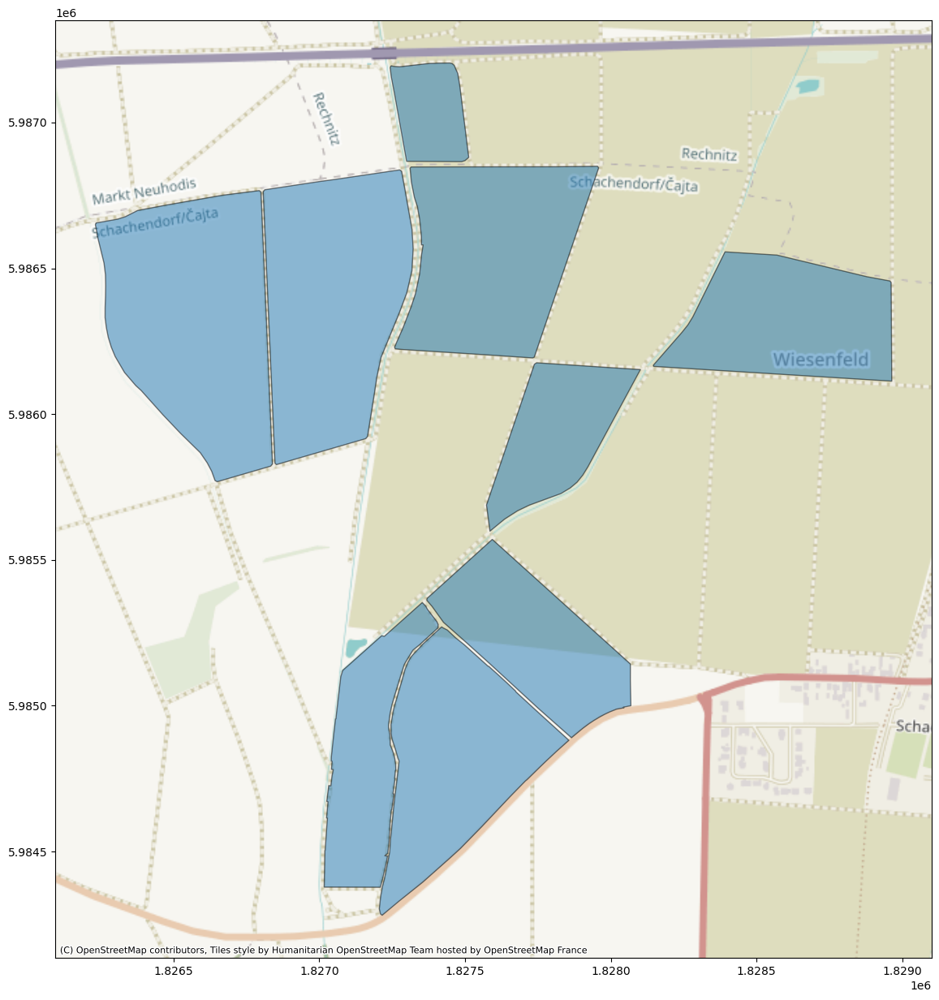

In [29]:

# Read the land cover samples into a GeoDataFrame
polygons_gdf = gpd.read_file(austria_fields)

# Calculate the area for each geometry and add it as a new column
polygons_gdf["area"] = polygons_gdf.geometry.area

# Explore the GeoDataFrame, visualizing the 'area' column with a specified colormap
ax = polygons_gdf.plot(alpha=0.5, edgecolor="k", figsize = (15,15))
cx.add_basemap(ax)

For each polygon, we define a Statistical API request. Requested statistical data will be calculated on `10`-meter resolution and aggregated per day with an available acquisition. We will also request histogram values.

In [30]:
yearly_time_interval = "2020-01-01", "2020-12-31"

ndvi_evalscript = """
//VERSION=3

function setup() {
  return {
    input: [
      {
        bands: [
          "B04",
          "B08",
          "dataMask"
        ]
      }
    ],
    output: [
      {
        id: "ndvi",
        bands: 1
      },
      {
        id: "dataMask",
        bands: 1
      }
    ]
  }
}

function evaluatePixel(samples) {
    return {
      ndvi: [index(samples.B08, samples.B04)],
      dataMask: [samples.dataMask]
    };
}
"""

aggregation = SentinelHubStatistical.aggregation(
    evalscript=ndvi_evalscript, time_interval=yearly_time_interval, aggregation_interval="P5D", resolution=(10, 10)
)

input_data = SentinelHubStatistical.input_data(
    DataCollection.SENTINEL2_L2A.define_from("s2l2a", service_url=config.sh_base_url), maxcc=0.1
)

ndvi_requests = []

for geo_shape in polygons_gdf.geometry.values:
    request = SentinelHubStatistical(
        aggregation=aggregation,
        input_data=[input_data],
        geometry=Geometry(geo_shape, crs=CRS(polygons_gdf.crs)),
        config=config,
    )
    ndvi_requests.append(request)

Instead of triggering download for each request separately, we can pass request objects together to a download client object, which will execute them in parallel using multiple threads. This way the download process will be faster.

In [31]:
%%time

download_requests = [ndvi_request.download_list[0] for ndvi_request in ndvi_requests]

client = SentinelHubStatisticalDownloadClient(config=config)

ndvi_stats = client.download(download_requests)

len(ndvi_stats)

CPU times: user 79.2 ms, sys: 34.7 ms, total: 114 ms
Wall time: 3.52 s


9

Let's convert this data into a tabular form by transforming it into a `pandas` dataframe.

In [34]:
ndvi_dfs = [stats_to_df(polygon_stats) for polygon_stats in ndvi_stats]

for df, land_type in zip(ndvi_dfs, polygons_gdf["fid"].values):
    df["land_type"] = land_type

ndvi_df = pd.concat(ndvi_dfs)

ndvi_df

,interval_from,interval_to,ndvi_B0_min,ndvi_B0_max,ndvi_B0_mean,ndvi_B0_stDev,ndvi_B0_sampleCount,ndvi_B0_noDataCount,land_type
0,2020-01-01,2020-01-06,0.334773,0.792869,0.686546,0.082388,918,131,1285619
1,2020-01-06,2020-01-11,0.364155,0.781119,0.682306,0.073129,918,131,1285619
2,2020-01-21,2020-01-26,0.298132,0.581845,0.454553,0.050769,918,131,1285619
3,2020-02-20,2020-02-25,0.300062,0.654984,0.528909,0.062329,918,131,1285619
4,2020-03-16,2020-03-21,0.030012,0.593115,0.261111,0.143320,918,131,1285619
...,...,...,...,...,...,...,...,...,...
20,2020-09-27,2020-10-02,0.349544,0.850759,0.448537,0.077422,6435,3115,1294609
21,2020-10-02,2020-10-07,0.323119,0.835528,0.418267,0.079983,6435,3115,1294609
22,2020-11-06,2020-11-11,0.144509,0.755224,0.226152,0.073764,6435,3115,1294609
23,2020-11-16,2020-11-21,0.139353,0.819533,0.238913,0.077411,6435,3115,1294609


The following plot shows time series of mean values, buffered by standard deviation values.

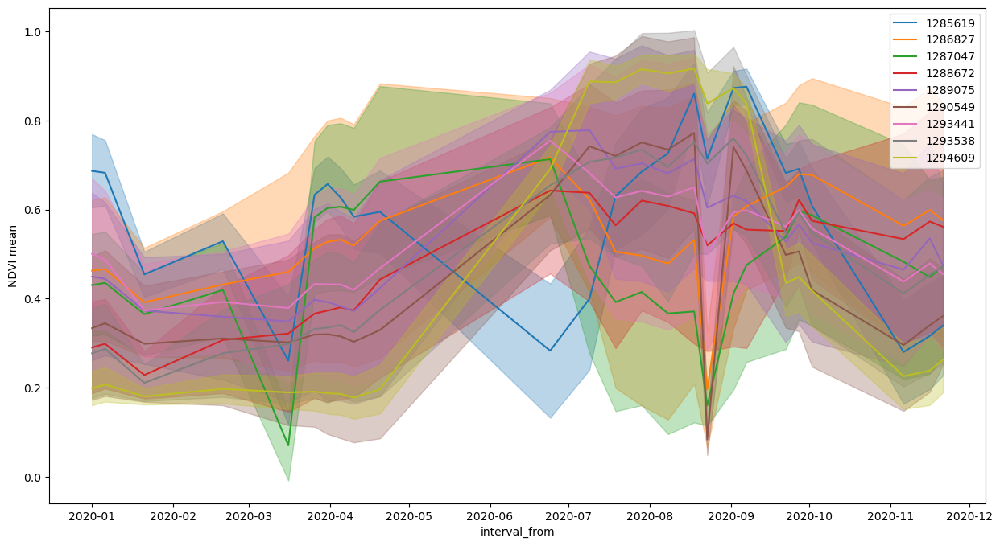

In [35]:
fig, ax = plt.subplots(figsize=(15, 8))
ax.set_ylabel("NDVI mean")

for idx, land_type in enumerate(polygons_gdf["fid"].values):
    series = ndvi_df[ndvi_df["land_type"] == land_type]

    series.plot(ax=ax, x="interval_from", y="ndvi_B0_mean", color=f"C{idx}", label=land_type)

    ax.fill_between(
        series.interval_from.values,
        series["ndvi_B0_mean"] - series["ndvi_B0_stDev"],
        series["ndvi_B0_mean"] + series["ndvi_B0_stDev"],
        color=f"C{idx}",
        alpha=0.3,
    );

### Example 2: Generating Chloropeth maps derived from statistics and administrative boundaries